In [1]:
!pip install pybullet


   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 103.2/103.2 MB 7.8 MB/s eta 0:00:00


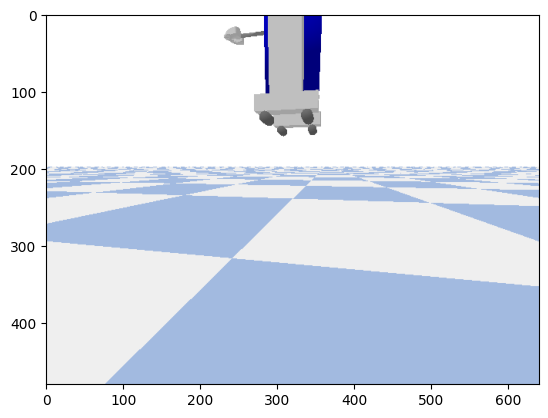

In [4]:
import pybullet as p
import pybullet_data
import matplotlib.pyplot as plt

p.connect(p.DIRECT)
p.setAdditionalSearchPath(pybullet_data.getDataPath())
p.loadURDF("plane.urdf")
robot = p.loadURDF("r2d2.urdf", [0, 0, 1])

# Capture and display image
width, height, rgb, depth, seg = p.getCameraImage(640, 480)
plt.imshow(rgb[:,:,:3])
plt.show()

# Move robot
p.setJointMotorControl2(robot, 2, p.VELOCITY_CONTROL, targetVelocity=5)
for i in range(100):
    p.stepSimulation()

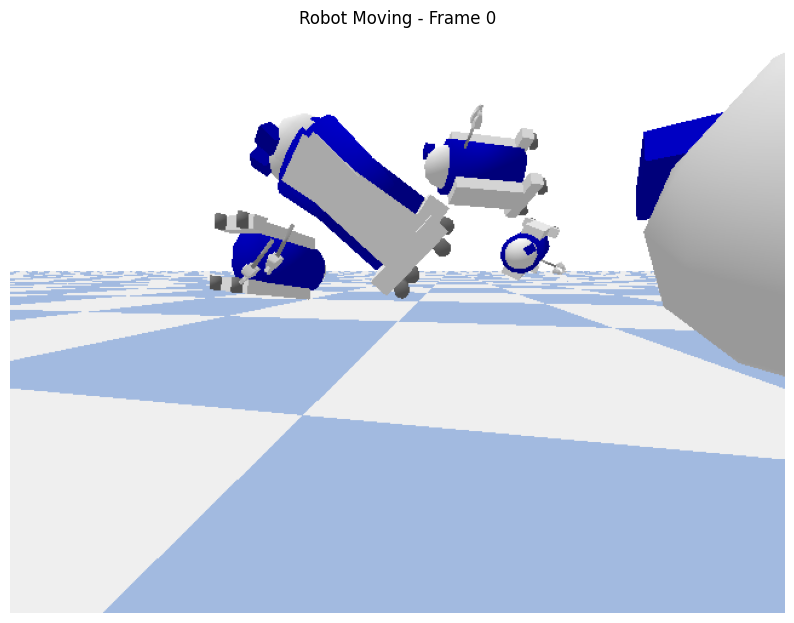

In [8]:
import pybullet as p
import pybullet_data
import matplotlib.pyplot as plt
import matplotlib.animation as animation
from IPython.display import HTML
import numpy as np

# Setup simulation
p.connect(p.DIRECT)
p.setAdditionalSearchPath(pybullet_data.getDataPath())
p.setGravity(0, 0, -10)
p.loadURDF("plane.urdf")
robot = p.loadURDF("r2d2.urdf", [0, 0, 1])

# Animation function
fig, ax = plt.subplots(figsize=(10, 8))
def animate(frame):
    # Move robot
    p.setJointMotorControl2(robot, 2, p.VELOCITY_CONTROL, targetVelocity=2)
    p.setJointMotorControl2(robot, 3, p.VELOCITY_CONTROL, targetVelocity=2)
    p.stepSimulation()

    # Capture frame
    width, height, rgb, depth, seg = p.getCameraImage(640, 480,
                                                      viewMatrix=p.computeViewMatrix([3,3,2], [0,0,0], [0,0,1]))
    ax.clear()
    ax.imshow(rgb[:,:,:3])
    ax.set_title(f'Robot Moving - Frame {frame}')
    ax.axis('off')

# Create and display animation
anim = animation.FuncAnimation(fig, animate, frames=100, interval=50)
HTML(anim.to_jshtml())

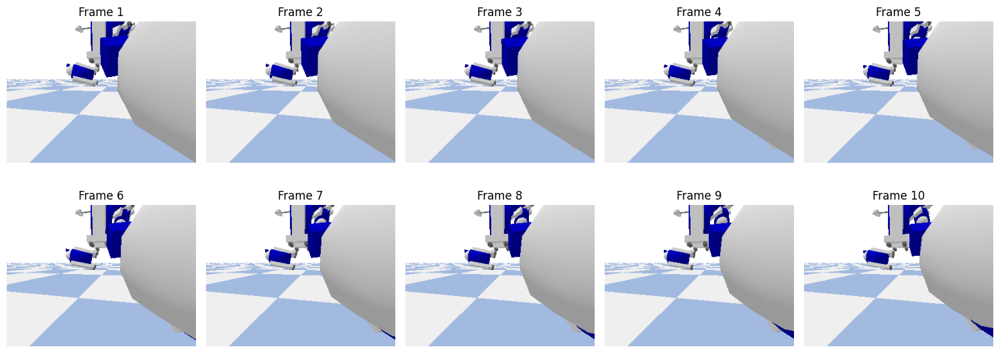

Robot moved to position: (-1.5524525956755644e-11, 4.358226679408319e-06, 0.9635962525107131)


In [7]:
import pybullet as p
import pybullet_data
import matplotlib.pyplot as plt
from PIL import Image
import io

# Setup simulation
p.connect(p.DIRECT)
p.setAdditionalSearchPath(pybullet_data.getDataPath())
p.setGravity(0, 0, -10)
p.loadURDF("plane.urdf")
robot = p.loadURDF("r2d2.urdf", [0, 0, 1])

# Capture frames while robot moves
frames = []
for i in range(20):  # Just 20 frames
    p.setJointMotorControl2(robot, 2, p.VELOCITY_CONTROL, targetVelocity=3)
    p.stepSimulation()

    # Capture frame
    width, height, rgb, _, _ = p.getCameraImage(320, 240)
    frames.append(rgb[:,:,:3])

# Display frames in a grid
fig, axes = plt.subplots(2, 5, figsize=(15, 6))
for i, ax in enumerate(axes.flat):
    if i < len(frames):
        ax.imshow(frames[i])
        ax.set_title(f'Frame {i+1}')
    ax.axis('off')

plt.tight_layout()
plt.show()

# Show robot's final position
pos, _ = p.getBasePositionAndOrientation(robot)
print(f"Robot moved to position: {pos}")